# Vector Cells Demo

In [2]:
from ratinabox.Neurons import FieldOfViewOVCs, ObjectVectorCells, FieldOfViewBVCs, BoundaryVectorCells
from ratinabox import Agent
from ratinabox import Environment
import functools

#autoreload the libraries
%load_ext autoreload
%autoreload 2

#### Initialize Environment, Agent

In [3]:
Env = Environment()
object_pos = Env.sample_positions(n=8,)
for i in range(1):
    Env.add_object(object_pos[i],type="same")

Ag = Agent(Env)

    • To AUTOMATICALLY save all plots (recommended), set  `ratinabox.autosave_plots = True`
    • To MANUALLY save plots, call                        `ratinabox.utils.save_figure(figure_object, save_title).
      This warning will not be shown again
HINT: You can stylize plots to make them look like repo/paper by calling `ratinabox.stylize_plots()`
      This hint will not be shown again


(<Figure size 300x300 with 1 Axes>, <Axes: >)

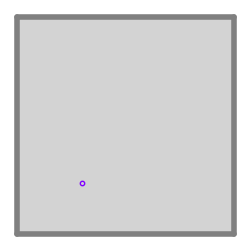

In [6]:
#See the environment
Env.plot_environment()

### Initialize all the types of Vector Cells Possible

In [27]:


OVCs = ObjectVectorCells(Ag, params={ 'n' : 10}) #as no manifold is mentioned random manifold is used

FoV_OVCs = FieldOfViewOVCs(Ag, params={
        "distance_range": [0.01, 0.4],  # min and max distances the agent can "see"
        "angle_range": [
            0,
            90,
        ],  # angluar FoV in degrees (will be symmetric on both sides, so give range in 0 (forwards) to 180 (backwards)
        "spatial_resolution": 0.06,  # resolution of each OVC tiling FoV
        "cell_arrangement": "uniform_manifold"
})


FoV_BVCs = FieldOfViewBVCs(Ag,params={
                            "distance_range": [0.01, 0.4],  # min and max distances the agent can "see"
                            "angle_range": [
                                0,
                                90,
                            ],  # angluar FoV in degrees (will be symmetric on both sides, so give range in 0 (forwards) to 180 (backwards)
                            "spatial_resolution": 0.06,  # resolution of each BVC tiling FoV, behaves a bit differently in diverging_manifold
                            "cell_arrangement": "diverging_manifold"
                            })

BVCs = BoundaryVectorCells(Ag, params={ 'n' : 5})


# Run the simulation for 30 seceonds

for i in range(int(30/Ag.dt)):
    Ag.update()
    FoV_OVCs.update()
    OVCs.update()
    FoV_BVCs.update()
    BVCs.update()
    

### Animating the Vecor Cells in a 2D space

In [11]:
#BVC with random tuning types for distance and angles
# ALLOCENTRIC

Ag.animate_trajectory(t_end=30, speed_up=5, additional_plot_func=BVCs.display_vector_cells)

In [12]:
#OVC with random tuning for distances and angles
# ALLOCENTRIC

Ag.animate_trajectory(t_end=30, speed_up=5, additional_plot_func=OVCs.display_vector_cells)

In [13]:
#Field of view of a vector cell (BVC). This has a 'diverging_manifold' in 'egocentric' coordinates
# See utils.create_diverging_radial_assembly for more details

Ag.animate_trajectory(t_end=30, speed_up=5, additional_plot_func=FoV_BVCs.display_vector_cells)

In [14]:
#Field of view of a vector cell (BVC). This has a 'uniform_manifold' in 'egocentric' coordinates
# See utils.create_uniform_radial_assembly for more details

Ag.animate_trajectory(t_end=30, speed_up=5, additional_plot_func=FoV_OVCs.display_vector_cells)

#### OVC Tuning Types

Each OVC object has a tuning types

In [34]:
Env = Environment()
object_pos = Env.sample_positions(n=2,)
for pos in object_pos:
    Env.add_object(pos)

Ag = Agent(Env)


# Create a OVC for each object type

FoV_OVCs = [FieldOfViewOVCs(Ag, params={
                            "distance_range": [0.01, 0.65],
                            "object_tuning_type" : i
                            }) for i in range(2)]


# Run the simulation for 30 seceonds

for i in range(int(30/Ag.dt)):
    Ag.update()
    for fov_ovc in FoV_OVCs:
        fov_ovc.update()

In [35]:
# This bank of OVC detect type==0
Ag.animate_trajectory(t_end=30, speed_up=5, additional_plot_func=FoV_OVCs[0].display_vector_cells)

In [36]:
# This bank of OVC detect type==1
Ag.animate_trajectory(t_end=30, speed_up=5, additional_plot_func=FoV_OVCs[1].display_vector_cells)

### EgoCentric And Allocentric

As the `tuning_distances` and `tuning_angles` are a property of the `VectorCell` one can have `diverging_manifold` for an `allocentric` Boundary Vector Cell


Please Note: The default direction for the Vector Cell class is in +X direction (East)

In [3]:
Env = Environment()
object_pos = Env.sample_positions(n=8,)
for i in range(1):
    Env.add_object(object_pos[i],type="same")
Env.add_wall([[0.5,0],[0.5,0.5]])

Ag = Agent(Env)


# Create a Boundary Vector Cell object that are ALLOCENTRIC and have a diverging manifold arrangement

BVCs = BoundaryVectorCells(Ag, params={
                            "distance_range": [0.01, 0.4],  # min and max distances the agent can "see"
                            "angle_range": [
                                0,
                                90,
                            ],  # angluar FoV in degrees (will be symmetric on both sides, so give range in 0 (forwards) to 180 (backwards)
                            "spatial_resolution": 0.06,  # resolution of each BVC tiling FoV, behaves a bit differently in diverging_manifold
                            "cell_arrangement": "diverging_manifold"
                            })


# Run the simulation for 30 seceonds

for i in range(int(30/Ag.dt)):
    Ag.update()
    BVCs.update()


/home/mehul/git_repos/RatInABox/ratinabox/utils.py:849: UserWarning: Found 3 unexpected params key(s) while initializing BoundaryVectorCells object: 'distance_range', 'angle_range', 'spatial_resolution'.
If you intended to set this parameter, ignore this message. To see all default parameters for this class call BoundaryVectorCells.get_all_default_params().
  warnings.warn(


See here that the direction of the cells do not change with the head direction as these are allocentric cells

In [4]:
Ag.animate_trajectory(t_end=30, speed_up=5, additional_plot_func=BVCs.display_vector_cells)

    • To AUTOMATICALLY save all plots (recommended), set  `ratinabox.autosave_plots = True`
    • To MANUALLY save plots, call                        `ratinabox.utils.save_figure(figure_object, save_title).
      This warning will not be shown again
HINT: You can stylize plots to make them look like repo/paper by calling `ratinabox.stylize_plots()`
      This hint will not be shown again


### Custom Tuning Distances and Angles

One can also pass in a function of their choice to set the appropriate manifolds 

For this they have to follow the follwing function signature

```python
def create_custom_manifold(**kwargs):
    # do operations
    # ensure  len(mu_d) == len(mu_theta) == len(sigma_d) == len(sigma_theta)

    return mu_distace,mu_angle, sigma_d,sigma_angle

```

mu_distance: distance preferences of the neurons

mu_angle: angular preferences (radians)

sigma_d: distance tunings - variance for the von miss distribution

sigma_angle: angular tunings (radians) - variance for the von miss distribution


In [51]:
import numpy as np
def create_custom_manifold(**kwargs):

    mu_distance = [0.1, 0.2, 0.3, 0.4, 0.5]
    mu_angle = [0.0, 0.0, 0.0, 0.0, 0.0]

    sigma_distance = [0.1, 0.1, 0.1, 0.1, 0.1]
    _sigma_angle = [0.06, 0.06, 0.06, 0.06, 0.06]
    sigma_angle = [_sigma_angle[i] / mu_distance[i] for i in range(len(_sigma_angle))]

    return mu_distance, mu_angle, sigma_distance, sigma_angle

In [56]:
Env = Environment()
object_pos = Env.sample_positions(n=8,)
for i in range(1):
    Env.add_object(object_pos[i],type="same")
Env.add_wall([[0.5,0],[0.5,0.5]])

Ag = Agent(Env)


# Create a Object Vector Cell object that are EGOCENTRIC with custom manifold

OVCs = ObjectVectorCells(Ag, params={
                            "cell_arrangement": create_custom_manifold,
                            "reference_frame": "egocentric",
                            })


# Run the simulation for 30 seceonds

for i in range(int(30/Ag.dt)):
    Ag.update()
    OVCs.update()

In [57]:
Ag.animate_trajectory(t_end=30, speed_up=5, additional_plot_func=OVCs.display_vector_cells)